<a href="https://www.kaggle.com/code/alihassanshahid/regression-of-used-car-prices?scriptVersionId=198597864" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

<div style="background-color:#e6f7ff; border: 2px solid #66c2ff; border-radius:10px; padding:20px;">
    <h2 style="color:#0066cc; font-family: Verdana;">🚗 Used Car Price Prediction</h2>
    <p style="color:#4d4d4d; font-size:14px;">
        This notebook aims to predict the prices of used cars based on various features like mileage, engine size, brand, and year. 
        We will use machine learning models like <strong style="color:#ff6666;">Linear Regression</strong>, <strong style="color:#ffcc66;">Decision Trees</strong>, 
        and <strong style="color:#99cc66;">Gradient Boosting</strong> to achieve this.
    </p>
    <ul style="color:#333333; font-size:15px;">
        <li style="color:#3399ff;">🔍 Data Cleaning & Preprocessing</li>
        <li style="color:#ff6666;">📊 Model Training & Evaluation</li>
        <li style="color:#66cc99;">📈 Model Comparison</li>
    </ul>
</div>


<div style="background-color:#e6f7ff; border: 2px solid #66c2ff; border-radius:10px; padding:20px;">
    <h2 style="color:#0066cc; font-family: Verdana;">📚 Import Libraries</h2>
    <p style="color:#4d4d4d; font-size:14px;">
        In this section, we will import the necessary libraries for data analysis, visualization, and model training.
    </p>
</div>


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly.express as px
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
import warnings
warnings.filterwarnings('ignore')

<div style="background-color:#e6f7ff; border: 2px solid #66c2ff; border-radius:10px; padding:20px;">
    <h2 style="color:#0066cc; font-family: Verdana;">📊 Load the Data</h2>
    <p style="color:#4d4d4d; font-size:14px;">
        In this section, we will load the training and test datasets from the provided CSV files. 
        We will also check for any missing values in the training dataset to understand data quality.
    </p>
</div>


In [10]:
df = pd.read_csv('/kaggle/input/playground-series-s4e9/train.csv')
dt = pd.read_csv('/kaggle/input/playground-series-s4e9/test.csv')
sf = pd.read_csv('/kaggle/input/playground-series-s4e9/sample_submission.csv')

print(df.isnull().sum())


id                  0
brand               0
model               0
model_year          0
milage              0
fuel_type        5083
engine              0
transmission        0
ext_col             0
int_col             0
accident         2452
clean_title     21419
price               0
dtype: int64


<div style="background-color:#e6f7ff; border: 2px solid #66c2ff; border-radius:10px; padding:20px;">
    <h2 style="color:#0066cc; font-family: Verdana;">🚨 Remove Outliers</h2>
    <p style="color:#4d4d4d; font-size:14px;">
        Outliers can skew the results of our analysis and model training. In this section, 
        we will identify and remove outliers from key numerical columns using the Interquartile Range (IQR) method.
    </p>
</div>


In [4]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

numeric_columns = ['milage', 'model_year', 'price']
for column in numeric_columns:
    df = remove_outliers(df, column)


<div style="background-color:#e6f7ff; border: 2px solid #66c2ff; border-radius:10px; padding:20px;">
    <h2 style="color:#0066cc; font-family: Verdana;">🔧 Handle Missing Values</h2>
    <p style="color:#4d4d4d; font-size:14px;">
        Missing values can lead to inaccuracies in our models. In this section, 
        we will identify and impute missing values for both categorical and numerical columns 
        using appropriate strategies.
    </p>
    <ul style="color:#333333; font-size:15px;">
        <li style="color:#3399ff;">🔹 Categorical columns will be filled with the most frequent value.</li>
        <li style="color:#ff6666;">🔹 Numerical columns will be filled with the mean value.</li>
    </ul>
</div>


In [5]:
categorical_columns = df.select_dtypes('object').columns
numerical_columns = df.select_dtypes(exclude='object').drop('price', axis=1).columns

categorical_imputer = SimpleImputer(strategy='most_frequent')
numerical_imputer = SimpleImputer(strategy='mean')
df[categorical_columns] = categorical_imputer.fit_transform(df[categorical_columns])
df[numerical_columns] = numerical_imputer.fit_transform(df[numerical_columns])


<div style="background-color:#e6f7ff; border: 2px solid #66c2ff; border-radius:10px; padding:20px;">
    <h2 style="color:#0066cc; font-family: Verdana;">⚙️ Model Training & Evaluation</h2>
    <p style="color:#4d4d4d; font-size:14px;">
        In this section, we will build a preprocessing pipeline to prepare our numerical and categorical data. 
        We'll then split the dataset into training and testing sets, followed by training several machine learning models. 
        The models we will evaluate include:
    </p>
    <ul style="color:#333333; font-size:15px;">
        <li style="color:#3399ff;">🔹 Linear Regression</li>
        <li style="color:#ff6666;">🔹 AdaBoost</li>
        <li style="color:#66cc99;">🔹 Gradient Boosting</li>
        <li style="color:#ffcc66;">🔹 XGBoost</li>
        <li style="color:#99cc66;">🔹 CatBoost</li>
    </ul>
    <p style="color:#4d4d4d; font-size:14px;">
        We will use cross-validation to evaluate model performance based on the Root Mean Squared Error (RMSE) metric.
    </p>
</div>


In [11]:
df.drop(['fuel_type', 'accident'], axis=1, inplace=True)

In [14]:
categorical_columns = [col for col in categorical_columns if col not in ['fuel_type', 'accident']]

preprocessor = ColumnTransformer([
    ('num', StandardScaler(), numerical_columns),
    ('cat', OneHotEncoder(drop='first', handle_unknown='ignore'), categorical_columns)
])

X = df.drop('price', axis=1)
y = df['price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

models = {
    'LinearRegression': LinearRegression(),
    # 'Lasso': Lasso(alpha=0.1),
    # 'AdaBoost': AdaBoostRegressor(n_estimators=500, random_state=42),
    # 'GradientBoosting': GradientBoostingRegressor(n_estimators=500, learning_rate=0.05, random_state=42),
    'XGBoost': XGBRegressor(n_estimators=1000, learning_rate=0.05, max_depth=6, random_state=42),
    'CatBoost': CatBoostRegressor(iterations=1000, learning_rate=0.05, depth=6, random_seed=42, verbose=False)
}

rmse_scorer = make_scorer(mean_squared_error, squared=False)
kf = KFold(n_splits=5, shuffle=True, random_state=42)

for name, model in models.items():
    pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('model', model)
    ])
    cv_scores = cross_val_score(pipeline, X_train, y_train, cv=kf, scoring=rmse_scorer)
    print(f"\nModel: {name}")
    print(f"Cross-validated RMSE: {np.mean(cv_scores):.4f}")

    pipeline.fit(X_train, y_train)
    y_pred = pipeline.predict(X_test)
    test_rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    print(f"Test RMSE: {test_rmse:.4f}")



Model: LinearRegression
Cross-validated RMSE: 75372.1515
Test RMSE: 69322.8624

Model: XGBoost
Cross-validated RMSE: 78555.6847
Test RMSE: 73386.3580

Model: CatBoost
Cross-validated RMSE: 75412.4600
Test RMSE: 70374.8480


In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 188533 entries, 0 to 188532
Data columns (total 11 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            188533 non-null  int64 
 1   brand         188533 non-null  object
 2   model         188533 non-null  object
 3   model_year    188533 non-null  int64 
 4   milage        188533 non-null  int64 
 5   engine        188533 non-null  object
 6   transmission  188533 non-null  object
 7   ext_col       188533 non-null  object
 8   int_col       188533 non-null  object
 9   clean_title   167114 non-null  object
 10  price         188533 non-null  int64 
dtypes: int64(4), object(7)
memory usage: 15.8+ MB


<div style="background-color:#e6f7ff; border: 2px solid #66c2ff; border-radius:10px; padding:20px;">
    <h2 style="color:#0066cc; font-family: Verdana;">📤 Making Predictions & Preparing Submission</h2>
    <p style="color:#4d4d4d; font-size:14px;">
        In this section, we will generate predictions for the test dataset using the trained AdaBoost model. 
        After obtaining the predictions, we will prepare the submission file in the required format and save it as a CSV file.
    </p>
</div>


In [18]:
submission_predictions = pipeline.predict(dt)

df_sub = sf.copy()
df_sub['price'] = submission_predictions

submission_file = 'submission_ada_boost.csv'
df_sub.to_csv(submission_file, index=False)

submission_df = pd.read_csv(submission_file)
print(submission_df.head())

       id         price
0  188533  18194.769482
1  188534  70905.889725
2  188535  53464.599609
3  188536  25220.042092
4  188537  34460.152920


<div style="background-color:#e6f7ff; border: 2px solid #66c2ff; border-radius:10px; padding:20px;">
    <h2 style="color:#0066cc; font-family: Verdana;">📊 Visualizations Overview</h2>
    <p style="color:#4d4d4d; font-size:14px;">
        In this section, we will explore various visualizations to gain insights into the used car dataset. 
        Each visualization highlights different aspects of the data, such as relationships between features, 
        distribution of prices, and comparisons across different brands and fuel types.
    </p>
    <ul style="color:#333333; font-size:15px;">
        <li style="color:#3399ff;">🔍 Bubble Plot: Engine Size vs. Price (Size by Mileage)</li>
        <li style="color:#ff6666;">🌳 Treemap: Average Price by Brand and Fuel Type</li>
        <li style="color:#66cc99;">📈 Parallel Coordinates Plot: Features Comparison</li>
    </ul>
</div>


In [22]:
s_df = df.head(1000)

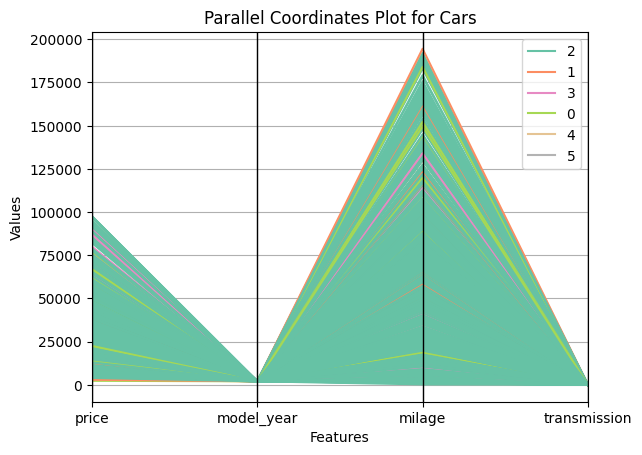

In [23]:
from pandas.plotting import parallel_coordinates
from sklearn.preprocessing import LabelEncoder

subset_df = s_df[['price', 'model_year', 'milage', 'fuel_type', 'transmission']]

subset_df['fuel_type'] = subset_df['fuel_type'].fillna('Unknown') 

label_encoder = LabelEncoder()
subset_df['transmission'] = label_encoder.fit_transform(subset_df['transmission'])
subset_df['fuel_type'] = label_encoder.fit_transform(subset_df['fuel_type'])

parallel_coordinates(subset_df, 'fuel_type', colormap=plt.get_cmap("Set2"))
plt.title("Parallel Coordinates Plot for Cars")
plt.xlabel("Features")
plt.ylabel("Values")
plt.show()


In [24]:
import plotly.express as px

fig = px.sunburst(s_df, path=['brand', 'model', 'fuel_type'], values='price', title='Sunburst Chart of Cars by Brand, Model, and Fuel Type')
fig.show()


In [25]:
fig = px.scatter(df, x='milage', y='price', 
                 size='model_year', color='fuel_type',
                 hover_name='brand', 
                 title='Interactive Scatter Plot: Price vs. Mileage',
                 labels={'milage': 'Mileage', 'price': 'Price'})
fig.show()

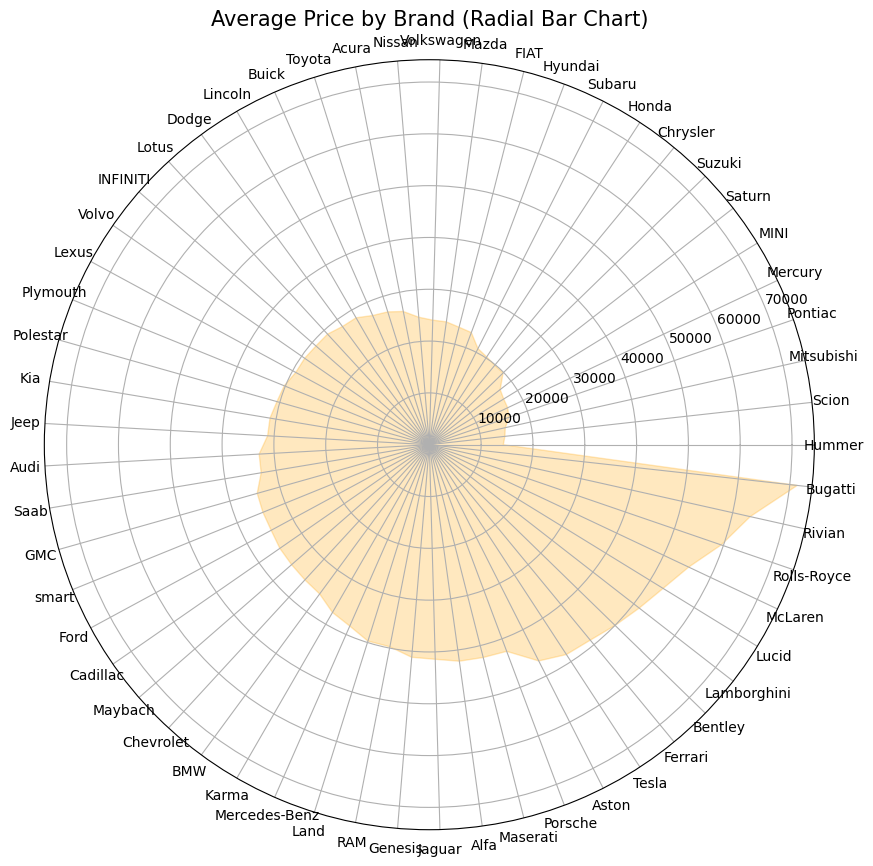

In [26]:
import numpy as np

avg_price_by_brand = df.groupby('brand')['price'].mean().sort_values()

categories = avg_price_by_brand.index
values = avg_price_by_brand.values

angles = np.linspace(0, 2 * np.pi, len(categories), endpoint=False).tolist()
values = np.concatenate((values,[values[0]]))
angles += angles[:1]

plt.figure(figsize=(10, 10))
ax = plt.subplot(111, polar=True)
ax.fill(angles, values, color='orange', alpha=0.25)
ax.set_xticks(angles[:-1])
ax.set_xticklabels(categories, fontsize=10)
ax.set_title('Average Price by Brand (Radial Bar Chart)', fontsize=15)
plt.show()


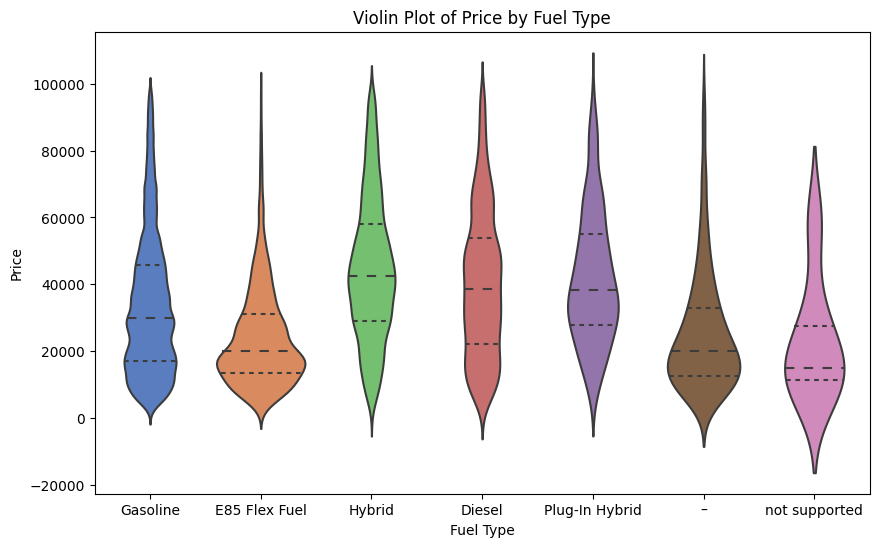

In [27]:
plt.figure(figsize=(10, 6))
sns.violinplot(data=df, x='fuel_type', y='price', inner='quartile', palette='muted')
plt.title('Violin Plot of Price by Fuel Type')
plt.xlabel('Fuel Type')
plt.ylabel('Price')
plt.show()


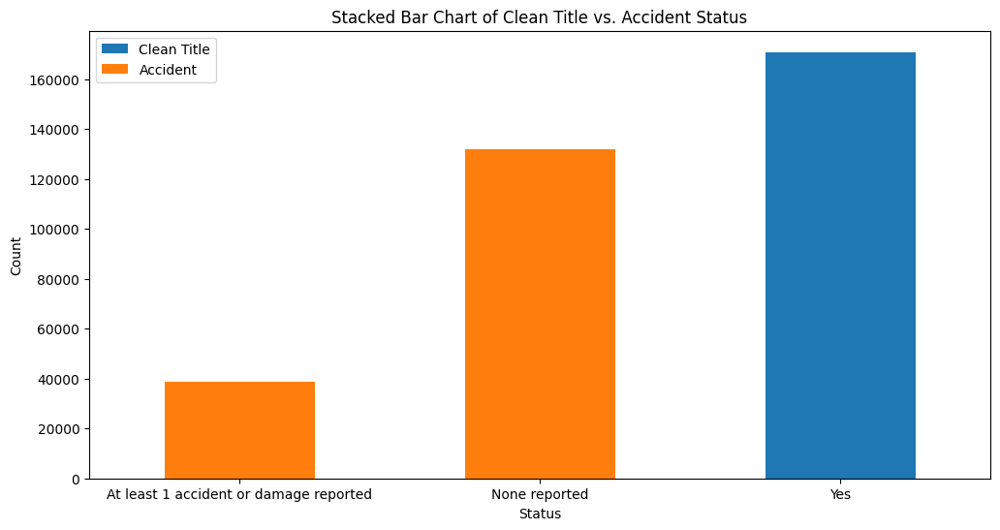

In [28]:
clean_title_counts = df['clean_title'].value_counts()
accident_counts = df['accident'].value_counts()

stacked_df = pd.DataFrame({
    'Clean Title': clean_title_counts,
    'Accident': accident_counts
}).fillna(0)

stacked_df.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title("Stacked Bar Chart of Clean Title vs. Accident Status")
plt.xlabel("Status")
plt.ylabel("Count")
plt.xticks(rotation=0)
plt.show()


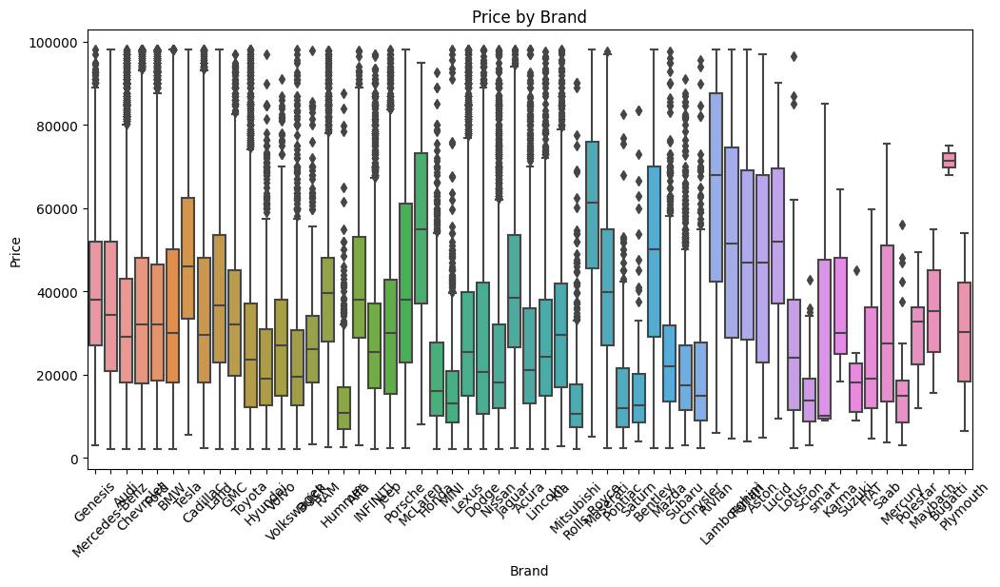

In [29]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='brand', y='price')
plt.title('Price by Brand')
plt.xticks(rotation=45)
plt.xlabel('Brand')
plt.ylabel('Price')
plt.show()


In [30]:
fig = go.Figure(data=[go.Scatter3d(
    x=df['milage'],
    y=df['model_year'],
    z=df['price'],
    mode='markers',
    marker=dict(
        size=5,
        color=df['price'], 
        colorscale='Viridis',
        showscale=True
    ),
    text=df['brand'] 
)])
fig.update_layout(title='3D Scatter Plot of Price, Mileage, and Model Year',
                  scene=dict(xaxis_title='Mileage',
                             yaxis_title='Model Year',
                             zaxis_title='Price'))
fig.show()


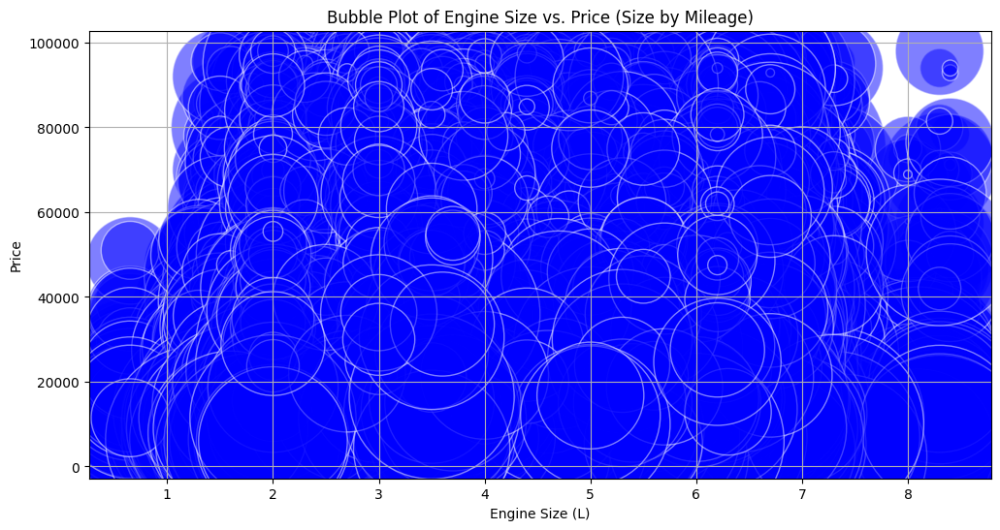

In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import re

def extract_engine_size(engine_str):
    match = re.search(r'(\d+\.\d+)L', engine_str) 
    if match:
        return float(match.group(1)) 
    return np.nan 

df['engine_size'] = df['engine'].apply(extract_engine_size)

plt.figure(figsize=(12, 6))
plt.scatter(df['engine_size'], df['price'], s=df['milage'] / 10, alpha=0.5, c='blue', edgecolors='w')
plt.title('Bubble Plot of Engine Size vs. Price (Size by Mileage)')
plt.xlabel('Engine Size (L)')
plt.ylabel('Price')
plt.grid()
plt.show()


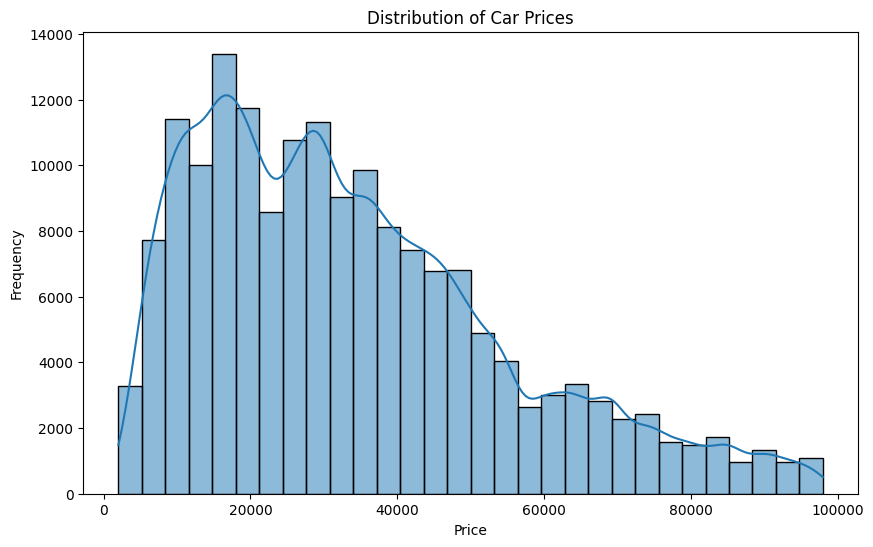

In [33]:
plt.figure(figsize=(10, 6))
sns.histplot(df['price'], bins=30, kde=True)
plt.title('Distribution of Car Prices')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()
